# Approach 2 — Spatial Clusters in GDV Point Clouds → Retrospective Investigation

**Logic (bottom-up, activation-space first):**
1. Take the UMAP projection of the best-GDV layer, coloured by interestingness label
2. Find spatial clusters purely from the 2-D point cloud geometry — no labels used
3. Number these clusters 1, 2, 3 …
4. Retrospectively characterise each cluster from scratch:
   - **Images** sorted by centrality (most representative of the cluster first)
   - **Distinctive terms** — fresh TF-IDF log-ratio of cluster explanations vs
     the rest of the same condition; no pre-assumed topic structure

**No pre-derived LDA topics are used here.** Each cluster gets its own fresh analysis.
Approach 1 imposes T1–T10 labels derived from all documents; here nothing is assumed
in advance — the activation geometry drives the grouping.

**Clustering method:** DBSCAN on raw 2-D UMAP coordinates (no standardisation).
- `eps` controls neighbourhood radius in raw UMAP space
- `min_samples` controls minimum cluster size
- Points in no cluster are labelled −1 (noise)


In [1]:
import sys, os
if os.path.basename(os.getcwd()) == 'analysis':
    os.chdir('..')
sys.path.insert(0, '.')
import re, pickle, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from PIL import Image
from sklearn.cluster import DBSCAN
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter, defaultdict

warnings.filterwarnings('ignore')
%matplotlib inline
plt.rcParams['figure.dpi'] = 110


In [2]:
GE_DIR      = 'data/experiments/gender_emotion'
METRICS_DIR = 'results/experiments/metrics'
IMG_DIR     = 'data/imagesDemographics'
LDA_DIR     = 'results/experiments/gender_emotion_analysis/lda'
OUT_DIR     = 'results/experiments/gender_emotion_analysis/lda/approach2'
os.makedirs(OUT_DIR, exist_ok=True)

EXPERIMENTS = [
    'female_anger','female_fear','female_disgust','female_sad',
    'female_amusement','female_awe','female_contentment','female_excitement','male_anger',
]
SHORT = {
    'female_anger':'F-Anger','female_fear':'F-Fear','female_disgust':'F-Disgust',
    'female_sad':'F-Sad','female_amusement':'F-Amus','female_awe':'F-Awe',
    'female_contentment':'F-Con','female_excitement':'F-Exc','male_anger':'M-Anger',
}
LABEL_ORDER  = ['Not Interesting','Slightly Interesting','Moderately Interesting',
                'Very Interesting','Extremely Interesting']
LABEL_COLORS = dict(zip(LABEL_ORDER,['#d62728','#ff7f0e','#1f77b4','#2ca02c','#9467bd']))
CLUSTER_CMAP = plt.colormaps['Set1']


In [3]:
# Load GDV data (projections + layer info)
gdv_data = {}
for exp in EXPERIMENTS:
    key = f'gender_{exp}'
    with open(f'{METRICS_DIR}/{key}/gdv.pkl','rb') as f:
        gdv_data[exp] = pickle.load(f)

MOD_ORDER = {'vision':0,'projector':1,'language':2,'unknown':3}
def _sk(lk):
    p=lk.split('_D'); b=p[0]; m,n=b.split('_',1); return (MOD_ORDER.get(m,3),int(n))

# Best overall layer (most negative GDV = best separation)
best_layer = {exp: min(gdv_data[exp]["gdv_per_layer"], key=gdv_data[exp]["gdv_per_layer"].get)
              for exp in EXPERIMENTS}

# Load raw results for explanations (needed for TF-IDF distinctive terms)
raw_results = {}   # exp → list of result dicts
for exp in EXPERIMENTS:
    d = np.load(f'{GE_DIR}/results_{exp}.npy', allow_pickle=True).item()
    raw_results[exp] = d['results']

# Build filename → explanation lookup per condition (same order as UMAP samples)
fn_to_explanation = {}   # exp → {filename: explanation}
for exp in EXPERIMENTS:
    fn_to_explanation[exp] = {r['filename']: r['explanation'] for r in raw_results[exp]}

print("Data loaded.")
for exp in EXPERIMENTS:
    lk  = best_layer[exp]
    gdv = gdv_data[exp]['gdv_per_layer'][lk]
    print(f"  {SHORT[exp]:<10}  best layer: {lk:<30}  GDV={gdv:.4f}")


Data loaded.
  F-Anger     best layer: language_47_D5120               GDV=-0.5569
  F-Fear      best layer: language_44_D5120               GDV=-0.4832
  F-Disgust   best layer: language_45_D5120               GDV=-0.4755
  F-Sad       best layer: language_45_D5120               GDV=-0.5484
  F-Amus      best layer: language_47_D5120               GDV=-0.3320
  F-Awe       best layer: language_45_D5120               GDV=-0.3086
  F-Con       best layer: language_45_D5120               GDV=-0.4629
  F-Exc       best layer: language_45_D5120               GDV=-0.3185
  M-Anger     best layer: language_47_D5120               GDV=-0.5583


---
## 1. DBSCAN Spatial Clustering on UMAP Coordinates

We cluster the 2-D UMAP coords (not the high-dimensional activations).
This finds **geometrically coherent groups** in the point cloud, whatever they represent.

- `eps` sweep to find a reasonable scale (shown in knee plot below)
- The resulting cluster IDs are NOT interestingness labels — they are purely spatial

**Key question to investigate in §2–4:** what do images in each spatial cluster
have in common — visually and linguistically?


In [4]:
def get_umap(exp, layer_key, setup_idx=0):
    info = gdv_data[exp]['layer_data'][layer_key]
    proj = info['projections']['umap']
    if not proj: proj = info['projections']['tsne']
    if not proj: return None, None
    key    = list(proj.keys())[setup_idx]
    coords = np.array(proj[key]['coords'])
    fnames = info['samples']['filenames']
    return coords, fnames

# ── Key insight from coordinate-space analysis ─────────────────────────────
# UMAP coords at best language layers are in raw scale x≈[-3,10], y≈[-5,15].
# StandardScaler inflates this by ~10x and merges all sub-clouds into one.
# Working in RAW UMAP space: 5-NN median distance ≈ 0.22–0.25.
# eps ≈ 0.5 raw → captures 2–4 meaningful regions per condition.
# eps ≈ 0.3 raw → separates isolated peripheral clouds with ~0-1% noise.

def dbscan_cluster(coords, eps=0.5, min_samples=10):
    """DBSCAN on RAW (un-standardised) 2-D UMAP coords."""
    return DBSCAN(eps=eps, min_samples=min_samples).fit_predict(coords)

def eps_sweep(coords, eps_vals=None, min_samples=10):
    """Cluster count and noise fraction vs eps — raw UMAP space."""
    if eps_vals is None:
        eps_vals = np.linspace(0.05, 2.0, 40)
    n_clusters, noise_fracs = [], []
    for e in eps_vals:
        lb = DBSCAN(eps=e, min_samples=min_samples).fit_predict(coords)
        n_clusters.append(len(set(lb)) - (1 if -1 in lb else 0))
        noise_fracs.append((lb == -1).mean())
    return eps_vals, n_clusters, noise_fracs


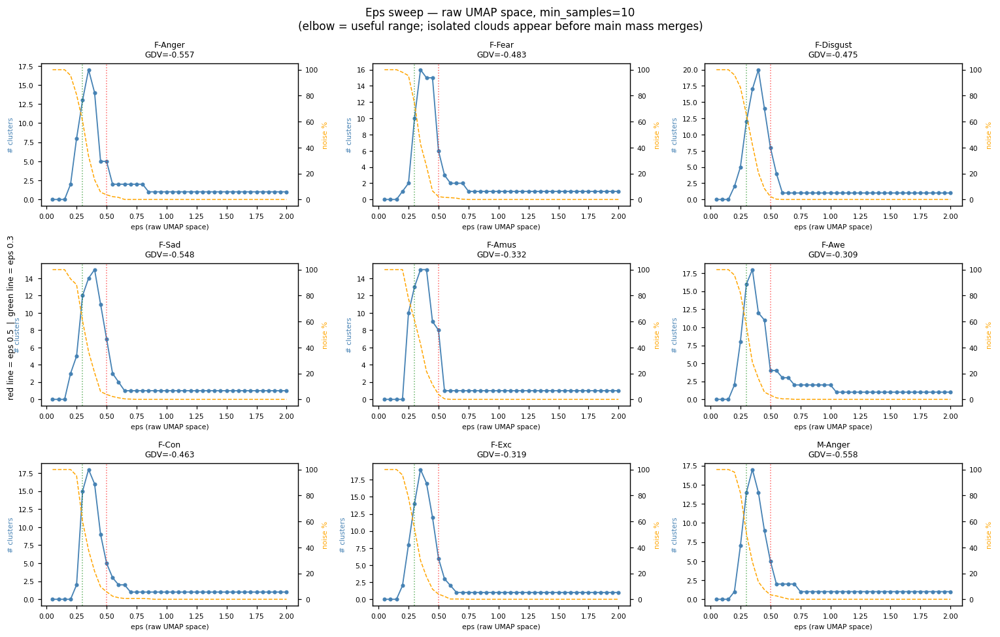

In [5]:
# ── Eps sweep across all conditions to find the right parameter zone ─────────
# Goal: find eps where isolated small clouds are captured before
# the main mass merges into a single cluster.
# The 'elbow' in the cluster-count curve is the useful range.

fig, axes = plt.subplots(3, 3, figsize=(14, 9))
axes = axes.flatten()
eps_vals_all = np.linspace(0.05, 2.0, 40)

for i, exp in enumerate(EXPERIMENTS):
    ax = axes[i]
    coords, _ = get_umap(exp, best_layer[exp])
    if coords is None:
        ax.set_title(f'{SHORT[exp]} — no UMAP'); continue

    ev, nc, nf = eps_sweep(coords, eps_vals_all, min_samples=10)

    ax2 = ax.twinx()
    ax.plot(ev, nc, 'o-', color='steelblue', markersize=3, linewidth=1.2, label='# clusters')
    ax2.plot(ev, np.array(nf)*100, '--', color='orange', linewidth=1.0, label='noise %')

    # Mark suggested eps
    ax.axvline(0.5, color='red', linestyle=':', alpha=0.6, linewidth=1.0)
    ax.axvline(0.3, color='green', linestyle=':', alpha=0.6, linewidth=1.0)

    ax.set_title(f'{SHORT[exp]}\nGDV={gdv_data[exp]["gdv_per_layer"][best_layer[exp]]:.3f}', fontsize=8)
    ax.set_xlabel('eps (raw UMAP space)', fontsize=7)
    ax.set_ylabel('# clusters', fontsize=7, color='steelblue')
    ax2.set_ylabel('noise %', fontsize=7, color='orange')
    ax.tick_params(labelsize=7)
    ax2.tick_params(labelsize=7)

fig.text(0.01, 0.5, 'red line = eps 0.5  |  green line = eps 0.3',
         va='center', rotation='vertical', fontsize=8)
plt.suptitle('Eps sweep — raw UMAP space, min_samples=10\n'
             '(elbow = useful range; isolated clouds appear before main mass merges)',
             fontsize=11)
plt.tight_layout()
plt.savefig(f'{OUT_DIR}/eps_sweep_all_conditions.png', dpi=120, bbox_inches='tight')
plt.show()


In [6]:
# ── Tune these two parameters ────────────────────────────────────────────────
# eps:         neighbourhood radius in raw UMAP space
#              0.3 → finds isolated peripheral clusters + some noise
#              0.5 → finds 2-4 major separated regions with minimal noise
# min_samples: minimum points to form a cluster core
#              lower = pick up smaller isolated clouds
#              higher = only capture dense regions

EPS         = 0.5    # start here; decrease toward 0.3 to reveal smaller isolated clouds
MIN_SAMPLES = 10

print(f"Using eps={EPS}, min_samples={MIN_SAMPLES} (raw UMAP space)")
print()

for exp in EXPERIMENTS:
    coords, _ = get_umap(exp, best_layer[exp])
    if coords is None: continue
    lbs = dbscan_cluster(coords, eps=EPS, min_samples=MIN_SAMPLES)
    n_c = len(set(lbs)) - (1 if -1 in lbs else 0)
    print(f"  {SHORT[exp]:<10}  {n_c} clusters  noise={100*(lbs==-1).mean():.0f}%")


Using eps=0.5, min_samples=10 (raw UMAP space)

  F-Anger     5 clusters  noise=4%
  F-Fear      6 clusters  noise=2%
  F-Disgust   8 clusters  noise=2%
  F-Sad       7 clusters  noise=4%
  F-Amus      8 clusters  noise=4%
  F-Awe       4 clusters  noise=3%
  F-Con       5 clusters  noise=6%
  F-Exc       6 clusters  noise=4%
  M-Anger     5 clusters  noise=3%


In [7]:
# Run DBSCAN on all experiments and store results
cluster_results = {}   # exp → {coords, fnames, cluster_ids, labels, filenames}

for exp in EXPERIMENTS:
    lk         = best_layer[exp]
    coords, fnames = get_umap(exp, lk)
    if coords is None:
        print(f"No UMAP for {exp}"); continue

    cluster_ids = dbscan_cluster(coords, eps=EPS, min_samples=MIN_SAMPLES)
    n_clust     = len(set(cluster_ids)) - (1 if -1 in cluster_ids else 0)
    noise_pct   = (cluster_ids==-1).mean()*100

    # Get interestingness labels from raw results
    lkey    = 'interestingness_label' if 'interestingness_label' in raw_results[exp][0] else 'interestingness'
    fn_lbl  = {r['filename']: r[lkey] for r in raw_results[exp]}
    lbl_ord = [fn_lbl.get(fn, '?') for fn in fnames]

    cluster_results[exp] = {
        'layer': lk, 'coords': coords, 'fnames': fnames,
        'cluster_ids': cluster_ids, 'labels': lbl_ord,
        'n_clusters': n_clust,
    }
    print(f"{SHORT[exp]:<10}  {lk:<28}  {n_clust} clusters  noise={noise_pct:.1f}%")


F-Anger     language_47_D5120             5 clusters  noise=3.6%
F-Fear      language_44_D5120             6 clusters  noise=2.2%
F-Disgust   language_45_D5120             8 clusters  noise=2.2%
F-Sad       language_45_D5120             7 clusters  noise=3.8%
F-Amus      language_47_D5120             8 clusters  noise=3.8%
F-Awe       language_45_D5120             4 clusters  noise=3.2%
F-Con       language_45_D5120             5 clusters  noise=5.8%
F-Exc       language_45_D5120             6 clusters  noise=4.0%
M-Anger     language_47_D5120             5 clusters  noise=3.4%


---
## 2. Point Cloud Visualisation — Labels vs Spatial Clusters

Two panels per condition:
1. **Interestingness labels** — what the model rated each image
2. **DBSCAN spatial clusters** — purely geometric grouping in activation space

The spatial clusters reveal structure that the interestingness labels may not
capture: images can cluster by visual content, resolution, or style even when
their interestingness ratings are mixed.


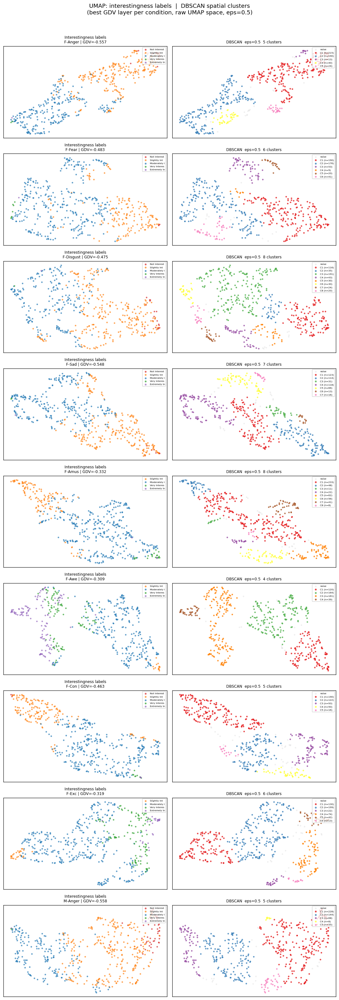

In [8]:
def plot_two_views(exp, ax_lbl, ax_clust):
    res = cluster_results.get(exp)
    if res is None:
        return
    coords  = res['coords']
    ids     = res['cluster_ids']
    lbls    = res['labels']
    lk      = res['layer']
    gdv     = gdv_data[exp]['gdv_per_layer'][lk]
    n_clust = res['n_clusters']

    # Interestingness labels
    for lbl in LABEL_ORDER:
        m = np.array([l==lbl for l in lbls])
        if m.any():
            ax_lbl.scatter(coords[m,0], coords[m,1], c=LABEL_COLORS[lbl],
                           s=10, alpha=0.7, linewidths=0, label=lbl[:12])
    ax_lbl.set_title(f'Interestingness labels\n{SHORT[exp]} | GDV={gdv:.3f}', fontsize=8)
    ax_lbl.legend(fontsize=5, markerscale=1.2, loc='upper right')
    ax_lbl.set_xticks([]); ax_lbl.set_yticks([])

    # DBSCAN spatial clusters
    unique_ids = sorted(set(ids))
    nc_nonoise = max(1, n_clust)
    for ci in unique_ids:
        m   = ids == ci
        col = '#cccccc' if ci==-1 else CLUSTER_CMAP(ci / nc_nonoise)
        lbl_str = 'noise' if ci==-1 else f'C{ci+1} (n={int(m.sum())})'
        ax_clust.scatter(coords[m,0], coords[m,1], c=[col], s=10,
                         alpha=0.3 if ci==-1 else 0.8, linewidths=0, label=lbl_str)
    ax_clust.set_title(f'DBSCAN  eps={EPS}  {n_clust} clusters', fontsize=8)
    ax_clust.legend(fontsize=5, markerscale=1.2, loc='upper right')
    ax_clust.set_xticks([]); ax_clust.set_yticks([])

nrows = len(EXPERIMENTS)
fig, axes = plt.subplots(nrows, 2, figsize=(10, nrows*3.2))
for i, exp in enumerate(EXPERIMENTS):
    plot_two_views(exp, axes[i,0], axes[i,1])

plt.suptitle('UMAP: interestingness labels  |  DBSCAN spatial clusters\n'
             f'(best GDV layer per condition, raw UMAP space, eps={EPS})',
             fontsize=12, y=1.01)
plt.tight_layout()
plt.savefig(f'{OUT_DIR}/spatial_clusters_all.png', dpi=120, bbox_inches='tight')
plt.show()


---
## 3. Cluster Analysis — Per-Cluster Retrospective Investigation

For each spatial cluster we show three things derived **fresh from that cluster only**:
1. **UMAP context** — where the cluster sits relative to all other images (coloured by label)
2. **Label distribution** — which interestingness labels fell into this cluster
3. **Distinctive terms** — TF-IDF log-ratio: words proportionally more frequent in
   this cluster's explanations vs all other images in the same condition
   (no pre-assumed topic structure, no T1–T10 labels)
4. **Image gallery** — cluster images sorted by **distance from centroid** in UMAP space;
   the most central (most representative) images appear first


In [9]:
def load_thumb(path, size=(80,80)):
    try:
        img = Image.open(path).convert('RGB')
        img.thumbnail(size, Image.LANCZOS)
        out = Image.new('RGB', size, (210,210,210))
        out.paste(img, ((size[0]-img.width)//2, (size[1]-img.height)//2))
        return np.array(out)
    except:
        return np.ones((*size,3),np.uint8)*180


# Evaluative stopwords — same as text_themes.py to surface content words
_EVAL_STOP = {
    'evoke','evokes','evoked','evoking','spark','sparks','capture','captures',
    'catches','caught','holds','hold','held','resonates','resonate','contrasts',
    'contrast','aligns','align','somewhat','rather','quite','particularly',
    'especially','briefly','brief','moment','seem','seems','appear','appears',
    'suggest','suggests','typical','usual','ordinary','mundane','common','simple',
    'certain','generally','often','sometimes','strong','stronger','emotion',
    'emotions','emotional','feeling','feelings','feel','feels','attention',
    'curiosity','curious','wonder','sense','mood','state','current','interest',
    'interested','interesting','fascinating','compelling','captivating','captivated',
    'significant','notable','intriguing','engaging','engaged','image','scene',
    'photo','picture','shows','show','shown','depicts','depict','depicting',
    'featuring','features','displayed','taken','captured','view','look','looks',
    'anger','angry','fear','fearful','disgust','disgusted','disgusting',
    'sadness','saddened','unease','uneasy','unsettling','excitement','excited',
    'doesn','isn','wasn','wouldn','couldn','due','given','because','since',
    'though','although','despite','however','while','whereas','yet','still',
    'the','and','but','for','are','was','were','has','had','its','this',
    'that','with','from','into','about','than','not','also','any','all',
    'some','each','both','more','just','make','makes','made','get','got',
    'one','two','three','can','could','would','will','may','might','must',
    'have','being','been','which','who','what','where','when','how','why',
    'such','like','well','too','very','even','most','many','much','way',
}

def _tfidf_distinctive(cluster_texts, background_texts, n_terms=10):
    """
    Return the top n terms by log-ratio TF:
        score(w) = log( (tf_cluster(w) + 1) / (tf_background(w) + 1) )
    Only content words (3+ chars, not in eval stop list) are considered.
    """
    def tokenise(texts):
        counts = Counter()
        for t in texts:
            for w in re.findall(r'\b[a-z]{3,}\b', t.lower()):
                if w not in _EVAL_STOP:
                    counts[w] += 1
        return counts

    c_cnt = tokenise(cluster_texts)
    b_cnt = tokenise(background_texts)
    c_total = max(1, sum(c_cnt.values()))
    b_total = max(1, sum(b_cnt.values()))

    vocab = set(c_cnt) | set(b_cnt)
    scores = {}
    for w in vocab:
        tf_c = c_cnt.get(w, 0) / c_total
        tf_b = b_cnt.get(w, 0) / b_total
        scores[w] = np.log((tf_c + 1e-4) / (tf_b + 1e-4))

    # Keep only words that appear at least twice in the cluster
    scores = {w: s for w, s in scores.items() if c_cnt.get(w, 0) >= 2}
    top = sorted(scores, key=scores.get, reverse=True)[:n_terms]
    return [(w, scores[w], c_cnt[w]) for w in top]


def analyse_spatial_cluster(exp, cluster_id, n_images=20):
    import matplotlib.gridspec as gridspec

    res = cluster_results.get(exp)
    if res is None: return
    coords, ids, lbls, fnames = res['coords'], res['cluster_ids'], res['labels'], res['fnames']
    lk  = res['layer']
    gdv = gdv_data[exp]['gdv_per_layer'][lk]

    mask   = np.array(ids == cluster_id)
    c_fns  = [fnames[i] for i in range(len(fnames)) if mask[i]]
    c_lbls = [lbls[i]   for i in range(len(lbls))   if mask[i]]
    c_xy   = coords[mask]

    if len(c_fns) == 0: return

    # Sort images by distance from cluster centroid (most central first)
    centroid   = c_xy.mean(axis=0)
    c_dists    = np.linalg.norm(c_xy - centroid, axis=1)
    sort_order = np.argsort(c_dists)
    c_fns_sorted  = [c_fns[i]  for i in sort_order]
    c_lbls_sorted = [c_lbls[i] for i in sort_order]

    # Distinctive terms: cluster explanations vs background explanations (same condition)
    exp_lookup   = fn_to_explanation[exp]
    cluster_txts = [exp_lookup.get(fn, '') for fn in c_fns]
    bg_txts      = [exp_lookup.get(fnames[i], '')
                    for i in range(len(fnames)) if not mask[i]]
    distinctive  = _tfidf_distinctive(cluster_txts, bg_txts, n_terms=12)

    # ── Layout: 2 rows ────────────────────────────────────────────────────
    n_show  = min(n_images, len(c_fns_sorted))
    ncols_g = min(10, n_show)
    nrows_g = (n_show + ncols_g - 1) // ncols_g

    fig = plt.figure(figsize=(22, 5.5 + nrows_g * 1.1))
    gs  = gridspec.GridSpec(2, 3, height_ratios=[4, nrows_g * 1.1],
                            hspace=0.4, wspace=0.3)

    # ── UMAP context with cluster highlighted ─────────────────────────────
    ax_cloud = fig.add_subplot(gs[0, 0])
    for lbl in LABEL_ORDER:
        m = [l==lbl for l in lbls]
        if any(m):
            ax_cloud.scatter(coords[m,0], coords[m,1], c=LABEL_COLORS[lbl],
                             s=7, alpha=0.25, linewidths=0)
    ax_cloud.scatter(c_xy[:,0], c_xy[:,1], c='black', s=30, alpha=0.9,
                     edgecolors='white', linewidths=0.5, zorder=5)
    # Mark centroid
    ax_cloud.scatter([centroid[0]], [centroid[1]], marker='*', c='yellow',
                     s=120, edgecolors='black', linewidths=0.8, zorder=6)
    ax_cloud.set_title(f'{SHORT[exp]} — C{cluster_id+1}\n{lk}\nGDV={gdv:.4f}', fontsize=8)
    ax_cloud.set_xticks([]); ax_cloud.set_yticks([])

    # ── Label distribution ────────────────────────────────────────────────
    ax_lbl = fig.add_subplot(gs[0, 1])
    total  = len(c_lbls)
    lbl_counts = Counter(c_lbls)
    vals = [100 * lbl_counts.get(l, 0) / total for l in LABEL_ORDER]
    ax_lbl.bar(range(len(LABEL_ORDER)), vals,
               color=[LABEL_COLORS[l] for l in LABEL_ORDER], edgecolor='white', width=0.7)
    ax_lbl.set_xticks(range(len(LABEL_ORDER)))
    ax_lbl.set_xticklabels([l[:10] for l in LABEL_ORDER], rotation=30, ha='right', fontsize=7)
    ax_lbl.set_ylabel('%'); ax_lbl.set_ylim(0, 100)
    ax_lbl.set_title(f'Label distribution  (n={total})', fontsize=8)
    ax_lbl.grid(axis='y', alpha=0.3)
    ax_lbl.spines['top'].set_visible(False); ax_lbl.spines['right'].set_visible(False)

    # ── Distinctive terms (TF-IDF log-ratio, fresh per cluster) ──────────
    ax_terms = fig.add_subplot(gs[0, 2])
    if distinctive:
        terms  = [t[0] for t in distinctive]
        scores = [t[1] for t in distinctive]
        counts = [t[2] for t in distinctive]
        colors = ['#2ca02c' if s > 0 else '#d62728' for s in scores]
        ax_terms.barh(range(len(terms)), scores[::-1], color=colors[::-1])
        ax_terms.set_yticks(range(len(terms)))
        ax_terms.set_yticklabels([f'{terms[::-1][i]} ({counts[::-1][i]})'
                                   for i in range(len(terms))], fontsize=7)
        ax_terms.axvline(0, color='black', linewidth=0.6)
        ax_terms.set_xlabel('log-ratio vs background', fontsize=7)
    ax_terms.set_title('Distinctive terms\n(cluster vs rest of condition)', fontsize=8)
    ax_terms.spines['top'].set_visible(False); ax_terms.spines['right'].set_visible(False)

    # ── Image gallery sorted by centrality ───────────────────────────────
    gs_bot = gridspec.GridSpecFromSubplotSpec(nrows_g, ncols_g, subplot_spec=gs[1, :],
                                              hspace=0.05, wspace=0.04)
    for gi, fn in enumerate(c_fns_sorted[:n_show]):
        ax = fig.add_subplot(gs_bot[gi // ncols_g, gi % ncols_g])
        ax.imshow(load_thumb(f'{IMG_DIR}/{fn}'))
        dist_str = f'{c_dists[sort_order[gi]]:.2f}'
        ax.set_title(dist_str, fontsize=4, pad=1, color='#555555')
        ax.axis('off')
    # Label first image
    if n_show > 0:
        fig.text(0.01, 0.02, '← most central (representative)', fontsize=7, color='#555555')

    fig.suptitle(f'Spatial Cluster C{cluster_id+1} — {SHORT[exp]} — {len(c_fns)} images  '
                 f'(gallery sorted by centrality)',
                 fontsize=11, y=1.01)
    plt.savefig(f'{OUT_DIR}/cluster_{exp}_C{cluster_id+1}.png', dpi=110, bbox_inches='tight')
    plt.show()
    print(f"Saved: cluster_{exp}_C{cluster_id+1}.png")



Condition: F-Awe  |  4 spatial clusters
Layer: language_45_D5120
  C1: 120 points


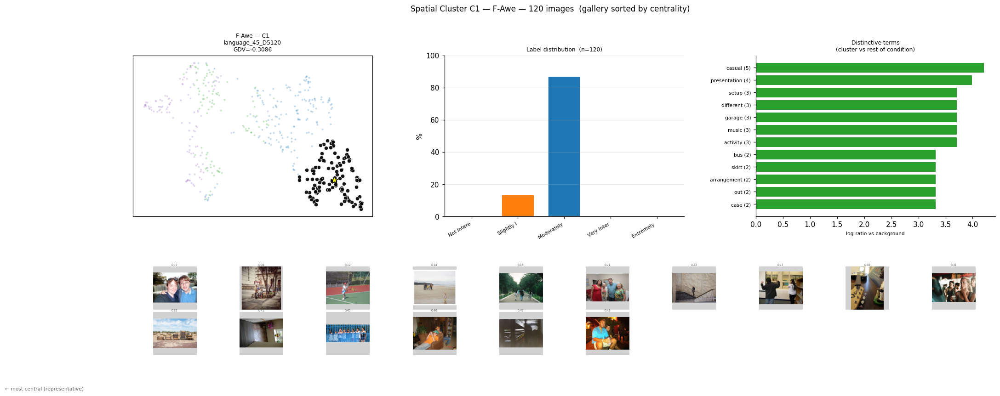

Saved: cluster_female_awe_C1.png
  C2: 164 points


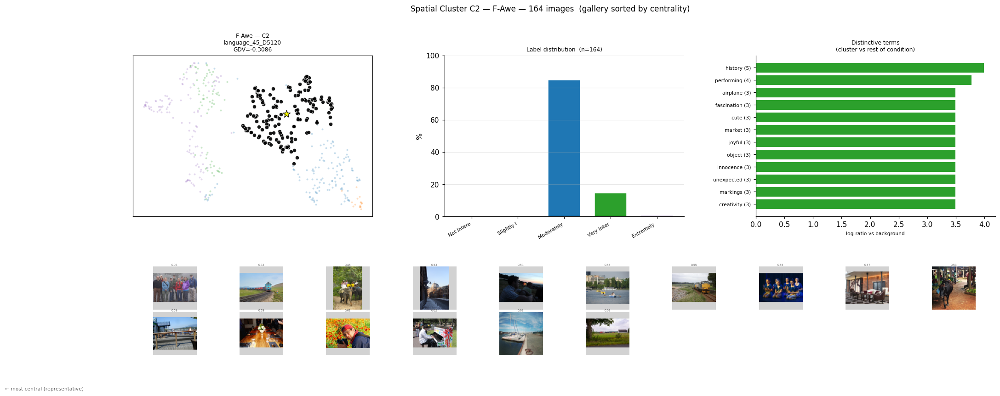

Saved: cluster_female_awe_C2.png
  C3: 161 points


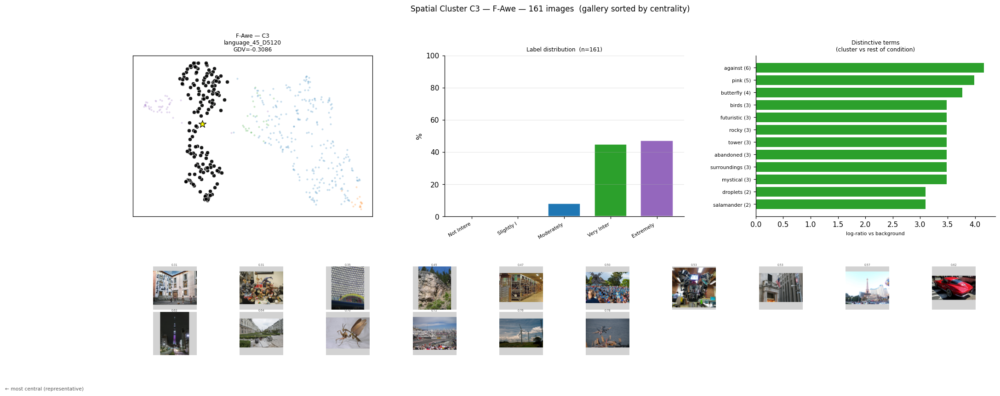

Saved: cluster_female_awe_C3.png
  C4: 39 points


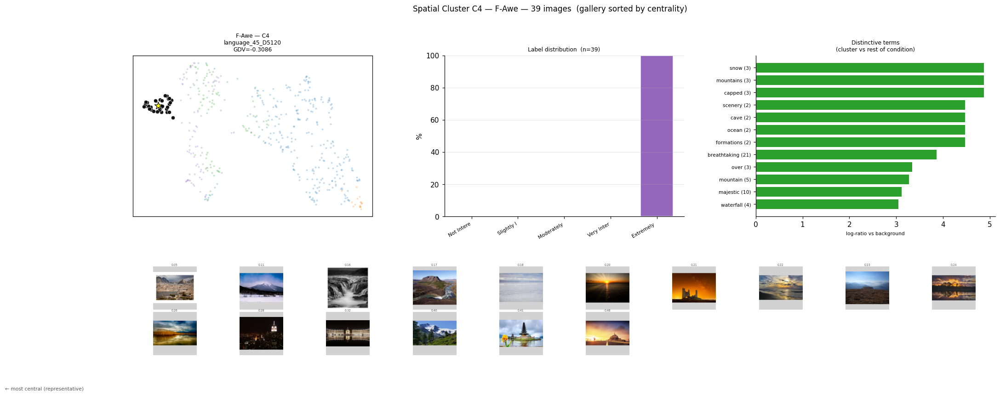

Saved: cluster_female_awe_C4.png

Condition: F-Disgust  |  8 spatial clusters
Layer: language_45_D5120
  C1: 116 points


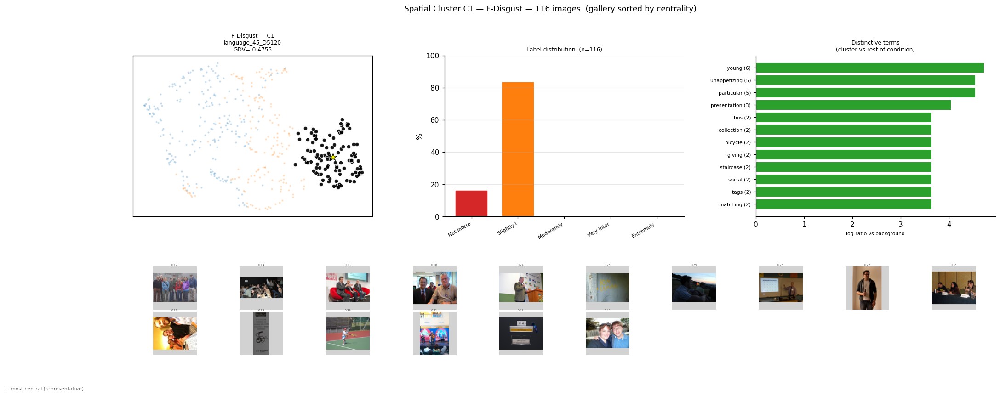

Saved: cluster_female_disgust_C1.png
  C2: 35 points


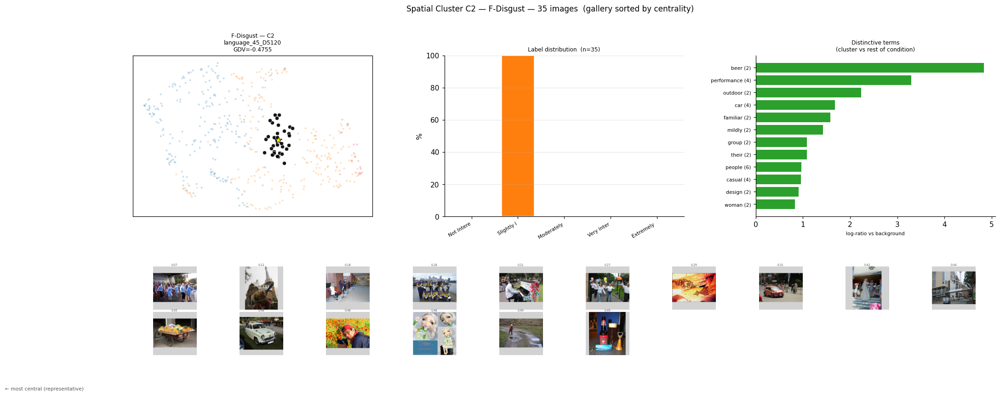

Saved: cluster_female_disgust_C2.png
  C3: 191 points


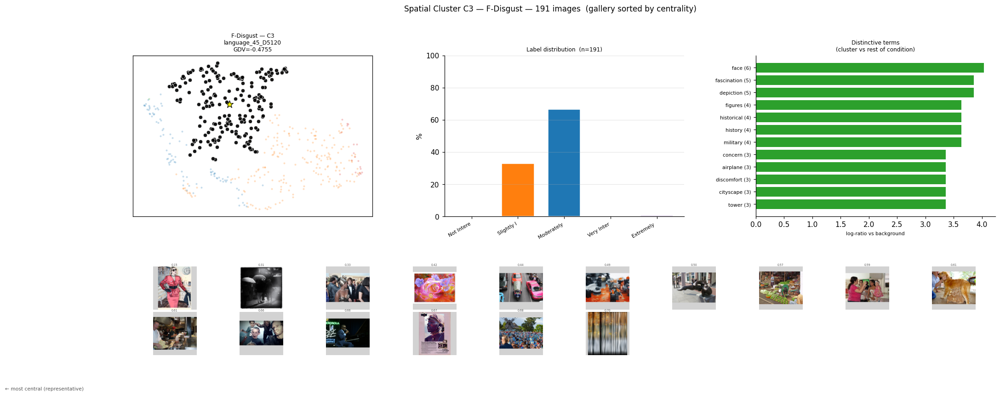

Saved: cluster_female_disgust_C3.png
  C4: 43 points


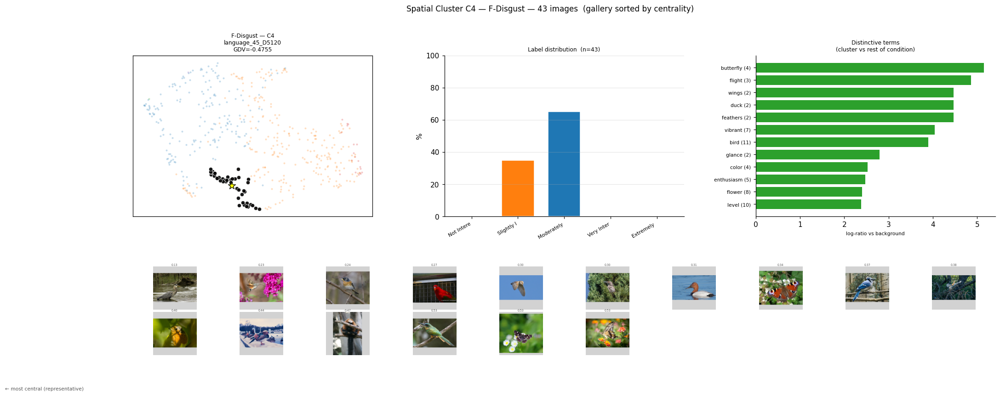

Saved: cluster_female_disgust_C4.png
  C5: 30 points


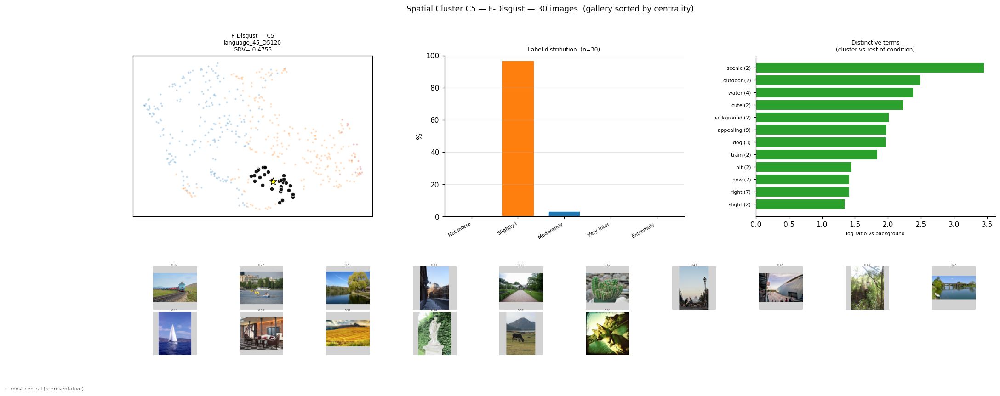

Saved: cluster_female_disgust_C5.png
  C6: 30 points


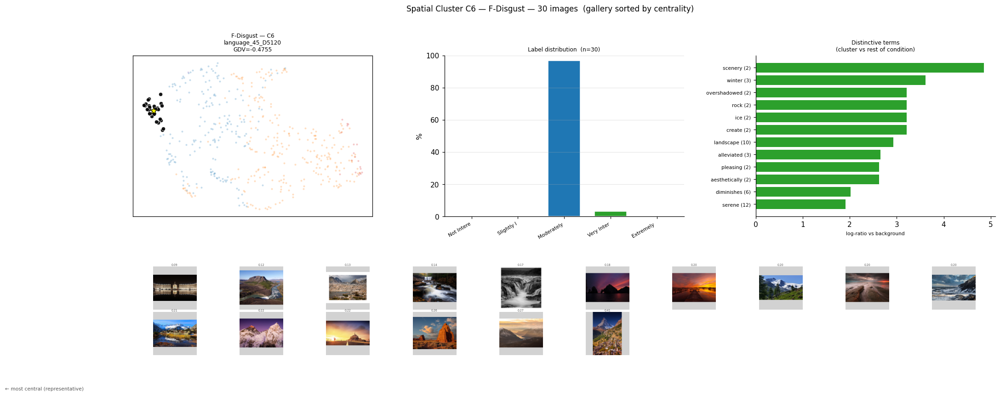

Saved: cluster_female_disgust_C6.png
  C7: 24 points


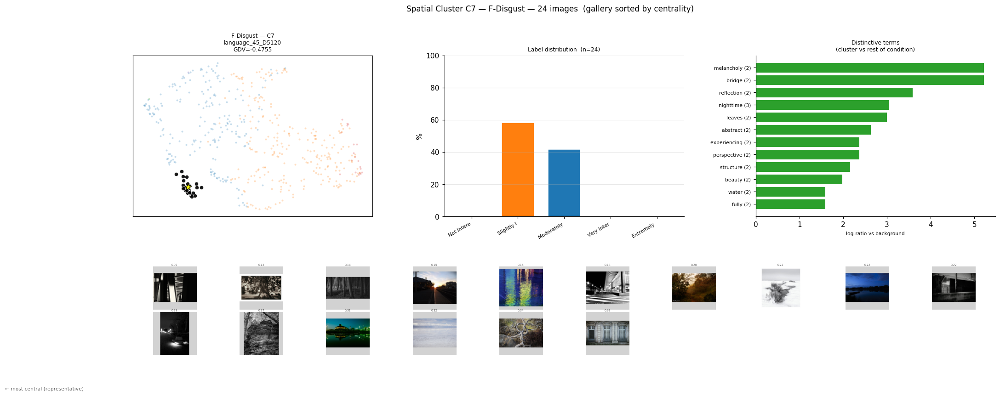

Saved: cluster_female_disgust_C7.png
  C8: 20 points


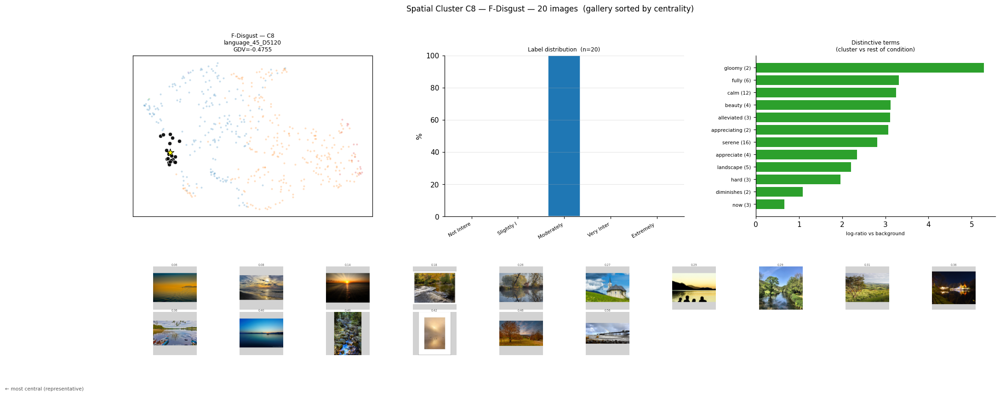

Saved: cluster_female_disgust_C8.png

Condition: F-Anger  |  5 spatial clusters
Layer: language_47_D5120
  C1: 215 points


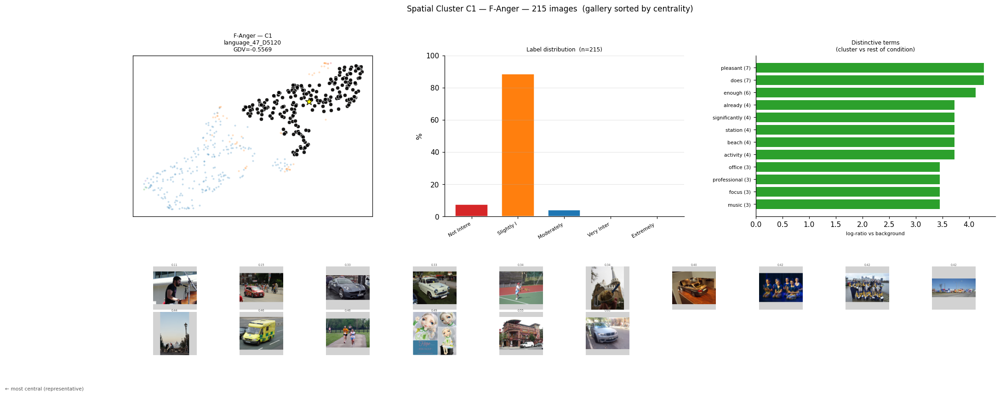

Saved: cluster_female_anger_C1.png
  C2: 190 points


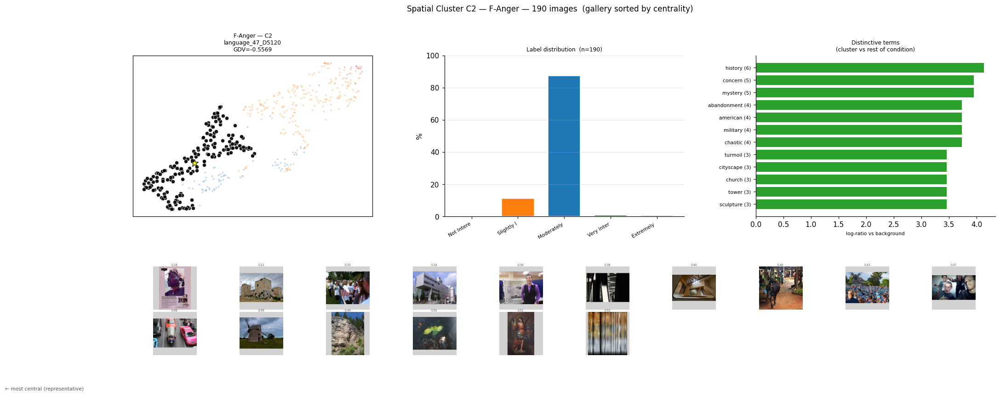

Saved: cluster_female_anger_C2.png
  C3: 13 points


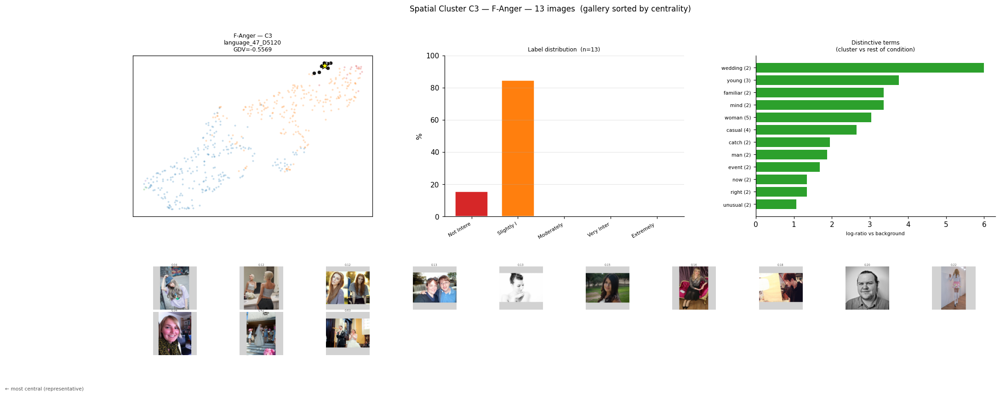

Saved: cluster_female_anger_C3.png
  C4: 40 points


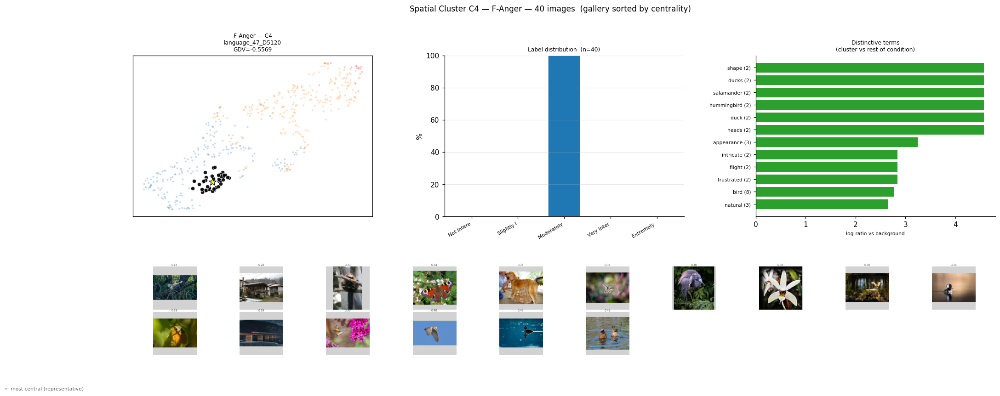

Saved: cluster_female_anger_C4.png
  C5: 24 points


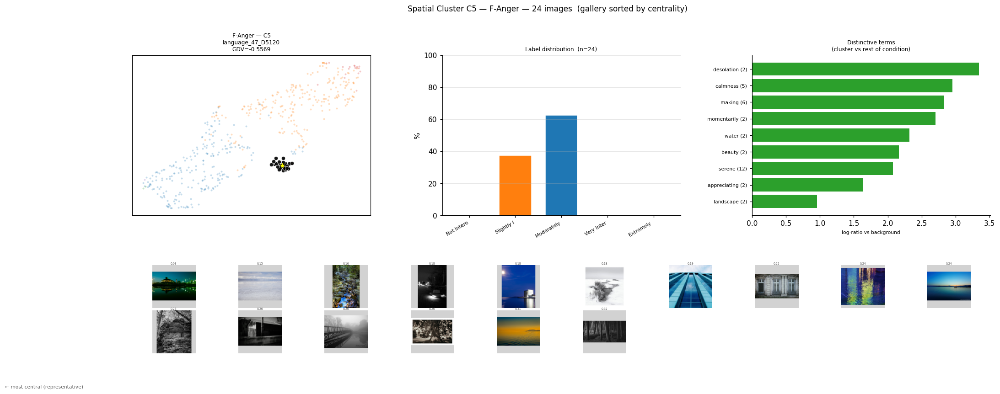

Saved: cluster_female_anger_C5.png

Condition: M-Anger  |  5 spatial clusters
Layer: language_47_D5120
  C1: 228 points


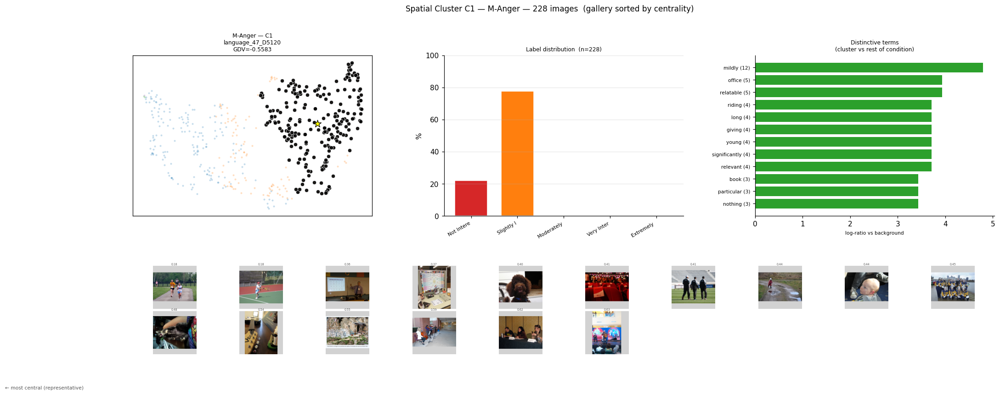

Saved: cluster_male_anger_C1.png
  C2: 144 points


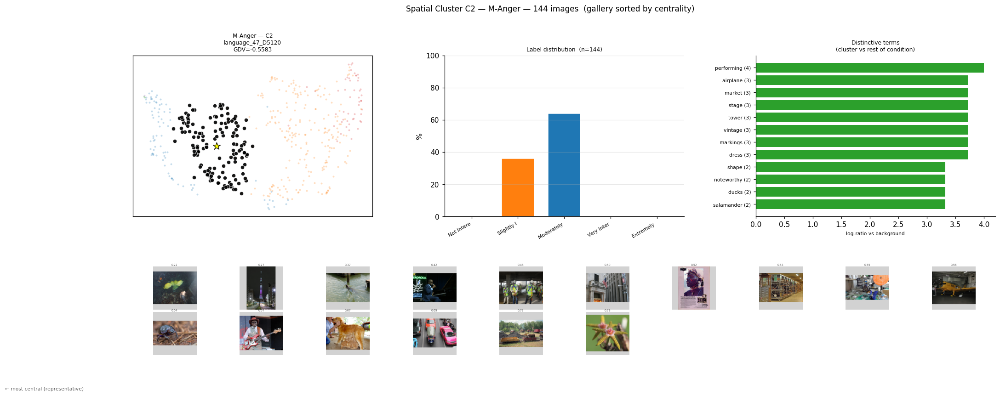

Saved: cluster_male_anger_C2.png
  C3: 68 points


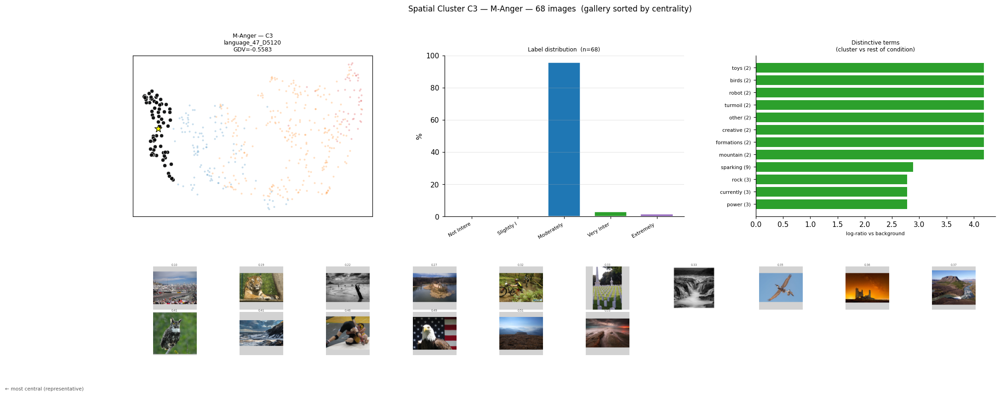

Saved: cluster_male_anger_C3.png
  C4: 8 points


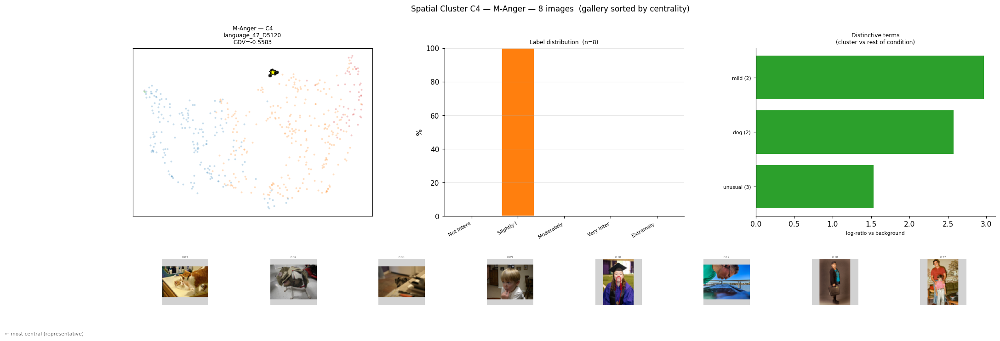

Saved: cluster_male_anger_C4.png
  C5: 35 points


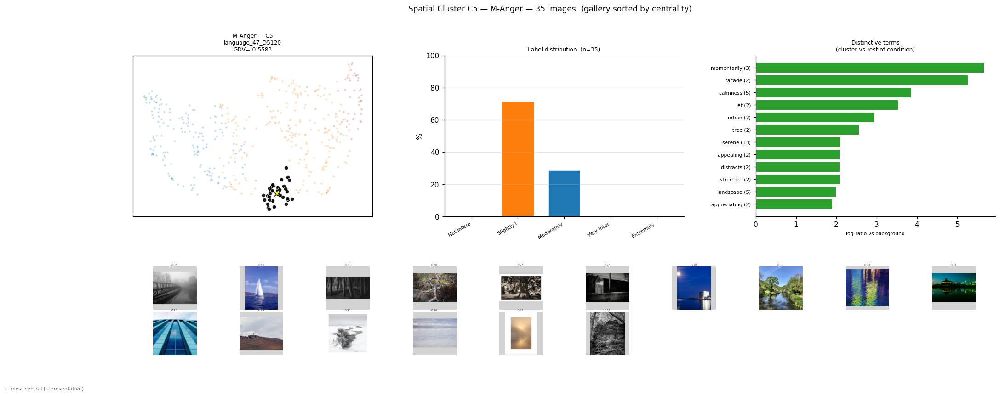

Saved: cluster_male_anger_C5.png


In [10]:
# Analyse ALL clusters for a selected set of conditions
# (change 'focus_experiments' to explore others)
focus_experiments = ['female_awe', 'female_disgust', 'female_anger', 'male_anger']

for exp in focus_experiments:
    res = cluster_results.get(exp)
    if res is None: continue
    print(f"\n{'='*60}")
    print(f"Condition: {SHORT[exp]}  |  {res['n_clusters']} spatial clusters")
    print(f"Layer: {res['layer']}")

    unique_ids = sorted(c for c in set(res['cluster_ids']) if c >= 0)
    for ci in unique_ids:
        mask = res['cluster_ids'] == ci
        print(f"  C{ci+1}: {mask.sum()} points")
        analyse_spatial_cluster(exp, ci, n_images=16)


---
## 4. Cross-Condition Cluster Comparison

For the same cluster_id assignment, do images consistently appear in the same
spatial cluster across different emotion conditions?  This reveals whether the
spatial geometry is stable across conditions (driven by image content) or
condition-specific (driven by the emotion persona's response pattern).


Mean cross-condition cluster stability: 0.520
Images always in same cluster (non-noise): 6


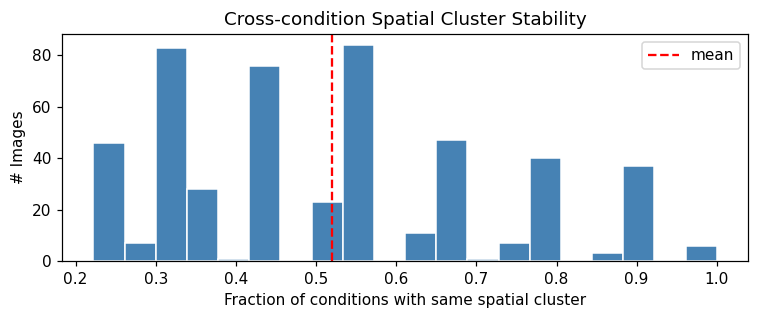

In [11]:
# Build image → cluster mapping for each condition
img_to_cluster = {}   # exp → {filename: cluster_id}
for exp in EXPERIMENTS:
    res = cluster_results.get(exp)
    if res is None: continue
    img_to_cluster[exp] = {fn: ci for fn, ci in zip(res['fnames'], res['cluster_ids'])}

# For each image present in all conditions, get the cluster sequence
all_fnames = list(img_to_cluster[EXPERIMENTS[0]].keys()) if EXPERIMENTS[0] in img_to_cluster else []
stability  = []
for fn in all_fnames:
    ids = [img_to_cluster[e].get(fn,-2) for e in EXPERIMENTS if e in img_to_cluster]
    # -1 = DBSCAN noise, -2 = missing
    # cluster agreement (exclude noise)
    non_noise = [i for i in ids if i >= 0]
    if len(non_noise) < 2:
        stab = 0.0
    else:
        most_common = Counter(non_noise).most_common(1)[0][1]
        stab = most_common / len(non_noise)
    stability.append({'filename': fn, 'stability': stab, 'cluster_ids': ids})

stab_df = pd.DataFrame(stability)
print(f"Mean cross-condition cluster stability: {stab_df['stability'].mean():.3f}")
print(f"Images always in same cluster (non-noise): {(stab_df['stability']==1.0).sum()}")

fig, ax = plt.subplots(figsize=(7,3))
ax.hist(stab_df['stability'], bins=20, color='steelblue', edgecolor='white')
ax.axvline(stab_df['stability'].mean(), color='red', linestyle='--', label='mean')
ax.set_xlabel('Fraction of conditions with same spatial cluster')
ax.set_ylabel('# Images')
ax.set_title('Cross-condition Spatial Cluster Stability')
ax.legend(); plt.tight_layout(); plt.show()


In [12]:
# Show the most stable (geometrically fixed) and most unstable images
print("\n=== Most stable images (same spatial cluster across all conditions) ===")
top_stable = stab_df.nlargest(10,'stability')
for _, row in top_stable.iterrows():
    fn  = row['filename']
    ids = row['cluster_ids']
    id_strs = [f'C{ci+1}' if ci>=0 else 'noise' for ci in ids]
    print(f"  {fn}  stab={row['stability']:.2f}  clusters: {id_strs}")

print("\n=== Most unstable images (different spatial cluster per condition) ===")
top_unstable = stab_df[stab_df['stability']<0.5].nsmallest(10,'stability')
for _, row in top_unstable.iterrows():
    fn  = row['filename']
    ids = row['cluster_ids']
    id_strs = [f'C{ci+1}' if ci>=0 else 'noise' for ci in ids]
    print(f"  {fn}  stab={row['stability']:.2f}  clusters: {id_strs}")



=== Most stable images (same spatial cluster across all conditions) ===
  0001.jpg  stab=1.00  clusters: ['C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1']
  0011.jpg  stab=1.00  clusters: ['C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1']
  0165.jpg  stab=1.00  clusters: ['C1', 'C1', 'C1', 'C1', 'noise', 'C1', 'C1', 'C1', 'C1']
  0311.jpg  stab=1.00  clusters: ['noise', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1']
  0321.jpg  stab=1.00  clusters: ['C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1']
  0809.jpg  stab=1.00  clusters: ['C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'noise', 'C1', 'C1']
  0007.jpg  stab=0.89  clusters: ['C1', 'C1', 'C1', 'C2', 'C1', 'C1', 'C1', 'C1', 'C1']
  0013.jpg  stab=0.89  clusters: ['C1', 'C1', 'C1', 'C2', 'C1', 'C1', 'C1', 'C1', 'C1']
  0017.jpg  stab=0.89  clusters: ['C1', 'C1', 'C1', 'C2', 'C1', 'C1', 'C1', 'C1', 'C1']
  0019.jpg  stab=0.89  clusters: ['C1', 'C1', 'C1', 'C2', 'C1', 'C1', 'C1', 'C1', 'C1']

=== Most unstable images (different s

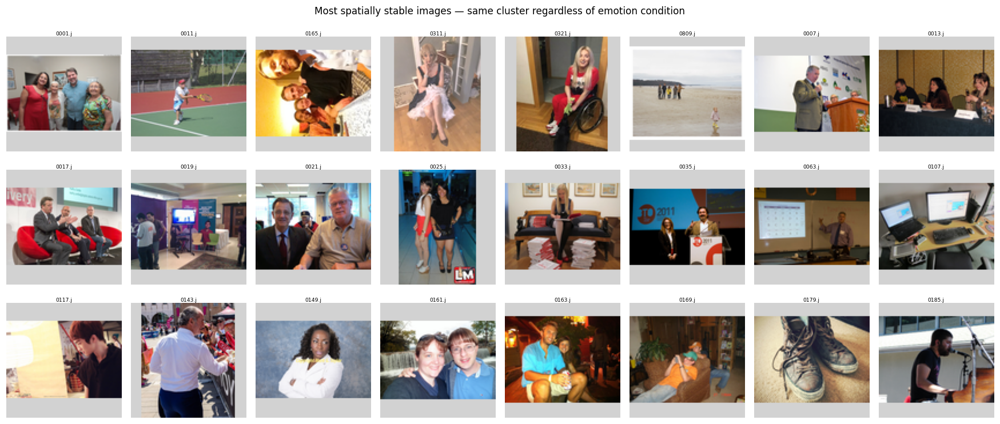

In [13]:
# Show top stable images as a gallery
stable_fns = stab_df.nlargest(24,'stability')['filename'].tolist()
fig, axes = plt.subplots(3, 8, figsize=(16, 7))
for ax, fn in zip(axes.flatten(), stable_fns):
    ax.imshow(load_thumb(f'{IMG_DIR}/{fn}', size=(100,100)))
    ax.set_title(fn[:6], fontsize=6, pad=1)
    ax.axis('off')
for ax in axes.flatten()[len(stable_fns):]:
    ax.axis('off')
plt.suptitle('Most spatially stable images — same cluster regardless of emotion condition', fontsize=11)
plt.tight_layout()
plt.savefig(f'{OUT_DIR}/stable_images_gallery.png', dpi=120, bbox_inches='tight')
plt.show()


---
## Summary

| Analysis | Purpose |
|----------|---------|
| §1 Eps sweep | Find the right eps for this data — elbow = useful range |
| §2 Point clouds | Labels vs DBSCAN geometry side by side |
| §3 Per-cluster panels | UMAP context + label distribution + distinctive terms + images sorted by centrality |
| §4 Cross-condition stability | Which images always cluster together (content-driven) vs scatter (condition-driven) |

**Interpretation guide:**
- **Distinctive terms** are computed fresh per cluster — no pre-assumed topic structure.
  Green bars = over-represented in cluster; words are content nouns after filtering evaluative boilerplate.
- **Gallery sorted by centrality** — images closest to the cluster centroid in UMAP space appear
  first; they are the most "typical" of what the activation space places in this region.
- **Stable images** (same cluster across conditions) → the image's visual content drives the grouping.
- **Unstable images** (different cluster per condition) → the emotion persona changes how the model
  internally represents that image — it ends up in a different activation-space neighbourhood.
